# DonorsChoose LSTM

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re

import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer


import pickle

from tqdm import tqdm
import datetime, os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers.normalization import BatchNormalization
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

Using TensorFlow backend.


In [2]:
# https://towardsdatascience.com/3-ways-to-load-csv-files-into-colab-7c14fcbdcb92

!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

     |████████████████████████████████| 993kB 5.0MB/s 


In [0]:
link1 = 'https://drive.google.com/open?id=1kE9NDi8CO8_JFqJJNaEzGx3JS0ZzkH_g' 
temp1, link_id1 = link1.split('=')

link2 = 'https://drive.google.com/open?id=11a69NID-7fzycHjmwANAQ8057DyexTXH' 
temp2, link_id2 = link2.split('=')

link3 = 'https://drive.google.com/open?id=18zVx15TPG9S2dQvxiJgGlMM_rX7iZrN3' 
temp3, link_id3 = link3.split('=')

In [0]:
# https://stackoverflow.com/questions/55443061/installing-google-appengine-on-google-colab-notebook
import logging

logging.getLogger('googleapicliet.discovery_cache').setLevel(logging.ERROR)

## 1.1 Reading Data

In [0]:
downloaded = drive.CreateFile({'id':link_id1}) 
downloaded.GetContentFile('train_data.csv')
project_data = pd.read_csv('train_data.csv')
downloaded = drive.CreateFile({'id':link_id2}) 
downloaded.GetContentFile('resources.csv')
resource_data = pd.read_csv('resources.csv')

In [7]:
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)

Number of data points in train data (109248, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [8]:
print("Number of data points in train data", resource_data.shape)
print(resource_data.columns.values)
resource_data.head(2)

Number of data points in train data (1541272, 4)
['id' 'description' 'quantity' 'price']


,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


## 1.2 preprocessing of `project_subject_categories`

In [0]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))


## 1.3 preprocessing of `project_subject_subcategories`

In [0]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## 1.3.1 resource summary contains numerical digit

In [0]:
# https://stackoverflow.com/questions/19859282/check-if-a-string-contains-a-number
import re
def hasDigits(inputText):
    return bool(re.search(r'\d', inputText))

In [0]:
digit_presence=[]
res_summary=project_data['project_resource_summary'].values
for i in res_summary:
    pres=hasDigits(i)
    if (pres):
        val=1
    else:
        val=0
    digit_presence.append(val)
project_data['resource_summary_contains_numerical_digits']=digit_presence

In [13]:
project_data['resource_summary_contains_numerical_digits'].value_counts()

0    93492
1    15756
Name: resource_summary_contains_numerical_digits, dtype: int64

## 1.3 Text preprocessing

In [0]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [15]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,resource_summary_contains_numerical_digits,essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,Literacy_Language,ESL Literacy,0,My students are English learners that are work...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,History_Civics Health_Sports,Civics_Government TeamSports,0,Our students arrive to our school eager to lea...


In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [0]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't",'the','they']

In [18]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    sent = re.sub('[!#?,.:";]', '', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.lower().split() if e not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 109248/109248 [01:07<00:00, 1614.29it/s]


In [19]:
# after preprocesing
print(preprocessed_essays[20000])

kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism eager beavers always strive work hardest working past limitations materials ones seek students teach title school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore ever felt like ants pants needed groove move meeting kids feel time want able move learn say wobble chairs answer love develop core enhances gross motor turn fine motor skills also want learn games kids not want sit worksheets want learn count jumping playing physical engagement key success number toss color shape mats make happen students forget work fun 6 year old deserves nannan


In [0]:
# storing the preprocessed essay and project titles in a new column in the project_data data frame
project_data['preprocessed_essay']=preprocessed_essays

In [0]:
# Calculating the price for the project and creating a price column in the project_data data frame

# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

In [0]:
# Counting the number of words in Essay

essay_len=[]
for sentance in project_data['preprocessed_essay'].values:
    temp=sentance.split()
    essay_len.append(len(temp))
    sentance=' '.join(temp)

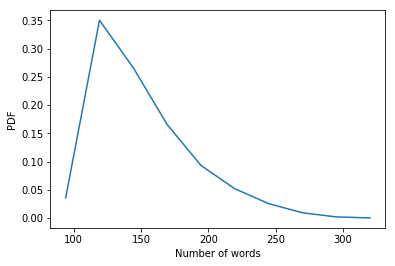

In [0]:
# Plotting PDF of Number of words in Essay

count_essay_words=np.array(essay_len)
counts, bin_edges = np.histogram(count_essay_words, bins=10, 
                                 density = True)
pdf = counts/(sum(counts))


plt.plot(bin_edges[1:],pdf)
plt.xlabel('Number of words')
plt.ylabel('PDF')
plt.show()

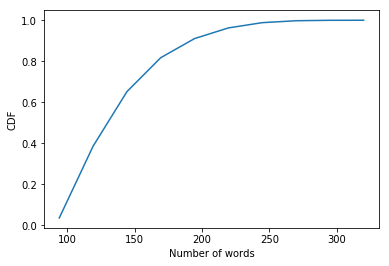

In [0]:
# Plotting CDF for Number of words in Essay

cdf = np.cumsum(pdf)

plt.plot(bin_edges[1:], cdf)
plt.xlabel('Number of words')
plt.ylabel('CDF')
plt.show()

From the CDF plot it can be seen that almost 95% of the essay text have number of words less than 275. So we can consider max_length=275 for padding

## 1.4 Preparing data for models

In [0]:
project_data.columns

Index(['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state',
       'project_submitted_datetime', 'project_grade_category', 'project_title',
       'project_essay_1', 'project_essay_2', 'project_essay_3',
       'project_essay_4', 'project_resource_summary',
       'teacher_number_of_previously_posted_projects', 'project_is_approved',
       'clean_categories', 'clean_subcategories',
       'resource_summary_contains_numerical_digits', 'essay',
       'preprocessed_essay', 'price', 'quantity'],
      dtype='object')

In [0]:
# https://stackoverflow.com/questions/13295735/how-can-i-replace-all-the-nan-values-with-zeros-in-a-column-of-a-pandas-datafra
# Replacing nan values in teacher_prefix as 'Nan' for one hot encoding so as to not loose data by dropping rows with nan
project_data['teacher_prefix'].fillna('Nan',inplace=True)

In [0]:
# Removing . from Teacher Prefix
teach_prefix=[]
for word in project_data['teacher_prefix'].values:
    word = re.sub('[.]', '', word)
    teach_prefix.append(word)
project_data['teacher_prefix']=teach_prefix

In [23]:
y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)
project_data.head(1)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,resource_summary_contains_numerical_digits,essay,price,quantity
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,Literacy_Language,ESL Literacy,0,My students are English learners that are work...,154.6,23


In [0]:
X = project_data

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [32]:
from keras.utils import np_utils 
# Converting Class Labels as 2-dimensional Vectors 
print("Class label of first data point :", y_train[17])


Y_train_cat = np_utils.to_categorical(y_train, 2) 
Y_cv_cat= np_utils.to_categorical(y_cv, 2) 
Y_test_cat = np_utils.to_categorical(y_test, 2)
print("After converting the output into a vector : ",Y_train_cat[17])

Class label of first data point : 1
After converting the output into a vector :  [0. 1.]


## Model 1

In [0]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
# https://stackoverflow.com/questions/51956000/what-does-keras-tokenizer-method-exactly-do

from keras.preprocessing.text import Tokenizer
t = Tokenizer()
t.fit_on_texts(X_train['preprocessed_essay'].values)
vocab_size = len(t.word_index) + 1
train_encoded_essay = t.texts_to_sequences(X_train['preprocessed_essay'].values)

In [0]:
# Preparing cv and test essay encodings
cv_encoded_essay = t.texts_to_sequences(X_cv['preprocessed_essay'].values)
test_encoded_essay = t.texts_to_sequences(X_test['preprocessed_essay'].values)

In [0]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
downloaded = drive.CreateFile({'id':link_id3}) 
downloaded.GetContentFile('glove_vectors')
with open('glove_vectors', 'rb') as f:
    glove_model = pickle.load(f)
    glove_words =  set(glove_model.keys())

In [0]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in t.word_index.items():
    embedding_vector = glove_model.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector    

In [0]:
from keras.layers import LSTM
from keras.layers.embeddings import Embedding
from keras.preprocessing import sequence
# truncate and/or pad input sequences
max_essay_length = 275
X_train_essay_padded = sequence.pad_sequences(train_encoded_essay, maxlen=max_essay_length)
X_test_essay_padded = sequence.pad_sequences(test_encoded_essay, maxlen=max_essay_length)
X_cv_essay_padded = sequence.pad_sequences(cv_encoded_essay, maxlen=max_essay_length)

In [0]:
from keras.layers import Input
from keras.models import Model
from keras.layers import concatenate

In [0]:
# Refered from LSTM Course code
# https://keras.io/getting-started/functional-api-guide/

embedding_vecor_length = 300
input_1_1=Input(shape=(275,), dtype='int32', name='input_1_1')
model_1_1=Embedding(vocab_size, embedding_vecor_length,weights=[embedding_matrix], input_length=max_essay_length,trainable=False)(input_1_1)
model_1_1=LSTM(60,return_sequences=True)(model_1_1)
model_1_1=Flatten()(model_1_1)
model_1_1=Dropout(0.2)(model_1_1)

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

no_of_unique_cat_2  = X_train['school_state'].nunique()
embedding_size_2 = min(np.ceil((no_of_unique_cat_2)/2), 50 )
embedding_size_2 = int(embedding_size_2)
vocab_2  = no_of_unique_cat_2+1
input_1_2=Input(shape=(1,), dtype='int32', name='input_1_2')
model_1_2= Embedding(vocab_2 ,embedding_size_2, input_length = 1 )(input_1_2)
model_1_2=Flatten()(model_1_2)
model_1_2=Dropout(0.25)(model_1_2)

In [0]:
# Preparing Data for school_state
# https://www.kaggle.com/aquatic/entity-embedding-neural-net

raw_vals_2 = np.unique(X_train['school_state'])
val_map_2 = {}

# Encoding categorical variables Starting from index 1

for i in range(len(raw_vals_2)):
    val_map_2[raw_vals_2[i]] = i+1
x_train_school_state=X_train['school_state'].map(val_map_2).values

# Encoding which are not present in Train but present in CV or Test data as 0

x_cv_school_state=X_cv['school_state'].map(val_map_2).fillna(0).values
x_test_school_state=X_test['school_state'].map(val_map_2).fillna(0).values

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

no_of_unique_cat_3  = X_train['project_grade_category'].nunique()
embedding_size_3 = min(np.ceil((no_of_unique_cat_3)/2), 50 )
embedding_size_3 = int(embedding_size_3)
vocab_3  = no_of_unique_cat_3+1
input_1_3=Input(shape=(1,), dtype='int32', name='input_1_3')
model_1_3= Embedding(vocab_3 ,embedding_size_3, input_length = 1 )(input_1_3)
model_1_3=Flatten()(model_1_3)
model_1_3=Dropout(0.2)(model_1_3)

In [0]:
# Preparing Data for project_grade_category
# https://www.kaggle.com/aquatic/entity-embedding-neural-net

raw_vals_3 = np.unique(X_train['project_grade_category'])
val_map_3 = {}

# Encoding categorical variables Starting from index 1

for i in range(len(raw_vals_3)):
    val_map_3[raw_vals_3[i]] = i+1
x_train_project_grade_category=X_train['project_grade_category'].map(val_map_3).values

# Encoding which are not present in Train but present in CV or Test data as 0

x_cv_project_grade_category=X_cv['project_grade_category'].map(val_map_3).fillna(0).values
x_test_project_grade_category=X_test['project_grade_category'].map(val_map_3).fillna(0).values

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

no_of_unique_cat_4  = X_train['clean_categories'].nunique()
embedding_size_4 = min(np.ceil((no_of_unique_cat_4)/2), 50 )
embedding_size_4 = int(embedding_size_4)
vocab_4  = no_of_unique_cat_4+1
input_1_4=Input(shape=(1,), dtype='int32', name='input_1_4')
model_1_4= Embedding(vocab_4 ,embedding_size_4, input_length = 1 )(input_1_4)
model_1_4=Flatten()(model_1_4)
model_1_4=Dropout(0.2)(model_1_4)

In [0]:
# Preparing Data for clean_categories
# https://www.kaggle.com/aquatic/entity-embedding-neural-net

raw_vals_4 = np.unique(X_train['clean_categories'])
val_map_4 = {}

# Encoding categorical variables Starting from index 1

for i in range(len(raw_vals_4)):
    val_map_4[raw_vals_4[i]] = i+1
x_train_clean_categories=X_train['clean_categories'].map(val_map_4).values

# Encoding which are not present in Train but present in CV or Test data as 0

x_cv_clean_categories=X_cv['clean_categories'].map(val_map_4).fillna(0).values
x_test_clean_categories=X_test['clean_categories'].map(val_map_4).fillna(0).values

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

no_of_unique_cat_5  = X_train['clean_subcategories'].nunique()
embedding_size_5 = min(np.ceil((no_of_unique_cat_5)/2), 50 )
embedding_size_5 = int(embedding_size_5)
vocab_5  = no_of_unique_cat_5+1
input_1_5=Input(shape=(1,), dtype='int32', name='input_1_5')
model_1_5= Embedding(vocab_5 ,embedding_size_5, input_length = 1 )(input_1_5)
model_1_5=Flatten()(model_1_5)
model_1_5=Dropout(0.25)(model_1_5)

In [0]:
# Preparing Data for clean_subcategories
# https://www.kaggle.com/aquatic/entity-embedding-neural-net

raw_vals_5 = np.unique(X_train['clean_subcategories'])
val_map_5 = {}

# Encoding categorical variables Starting from index 1

for i in range(len(raw_vals_5)):
    val_map_5[raw_vals_5[i]] = i+1
x_train_clean_subcategories=X_train['clean_subcategories'].map(val_map_5).values

# Encoding which are not present in Train but present in CV or Test data as 0

x_cv_clean_subcategories=X_cv['clean_subcategories'].map(val_map_5).fillna(0).values
x_test_clean_subcategories=X_test['clean_subcategories'].map(val_map_5).fillna(0).values

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

no_of_unique_cat_6  = X_train['teacher_prefix'].nunique()
embedding_size_6 = min(np.ceil((no_of_unique_cat_6)/2), 50 )
embedding_size_6 = int(embedding_size_6)
vocab_6  = no_of_unique_cat_6+1
input_1_6=Input(shape=(1,), dtype='int32', name='input_1_6')
model_1_6= Embedding(vocab_6 ,embedding_size_6, input_length = 1 )(input_1_6)
model_1_6=Flatten()(model_1_6)
model_1_6=Dropout(0.2)(model_1_6)

In [0]:
# Preparing Data for teacher_prefix
# https://www.kaggle.com/aquatic/entity-embedding-neural-net

raw_vals_6 = np.unique(X_train['teacher_prefix'])
val_map_6 = {}

# Encoding categorical variables Starting from index 1

for i in range(len(raw_vals_6)):
    val_map_6[raw_vals_6[i]] = i+1
x_train_teacher_prefix=X_train['teacher_prefix'].map(val_map_6).values

# Encoding which are not present in Train but present in CV or Test data as 0

x_cv_teacher_prefix=X_cv['teacher_prefix'].map(val_map_6).fillna(0).values
x_test_teacher_prefix=X_test['teacher_prefix'].map(val_map_6).fillna(0).values

In [0]:
# Refered from assignment sample solution 
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['price'].values.reshape(-1,1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(-1,1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(-1,1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(-1,1))

normalizer.fit(X_train['quantity'].values.reshape(-1,1))

X_train_quantity_norm = normalizer.transform(X_train['quantity'].values.reshape(-1,1))
X_cv_quantity_norm = normalizer.transform(X_cv['quantity'].values.reshape(-1,1))
X_test_quantity_norm = normalizer.transform(X_test['quantity'].values.reshape(-1,1))

normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

X_train_prev_posted_projects_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_cv_prev_posted_projects_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_prev_posted_projects_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

normalizer.fit(X_train['resource_summary_contains_numerical_digits'].values.reshape(-1,1))

x_train_resource_summary_contains_digits=normalizer.transform(X_train['resource_summary_contains_numerical_digits'].values.reshape(-1,1))
x_cv_resource_summary_contains_digits=normalizer.transform(X_cv['resource_summary_contains_numerical_digits'].values.reshape(-1,1))
x_test_resource_summary_contains_digits=normalizer.transform(X_test['resource_summary_contains_numerical_digits'].values.reshape(-1,1))

In [0]:
# https://docs.scipy.org/doc/numpy/reference/generated/numpy.hstack.html

x_train_rem_input_1=np.hstack((X_train_price_norm,X_train_quantity_norm,X_train_prev_posted_projects_norm,x_train_resource_summary_contains_digits))
x_cv_rem_input_1=np.hstack((X_cv_price_norm,X_cv_quantity_norm,X_cv_prev_posted_projects_norm,x_cv_resource_summary_contains_digits))
x_test_rem_input_1=np.hstack((X_test_price_norm,X_test_quantity_norm,X_test_prev_posted_projects_norm,x_test_resource_summary_contains_digits))
x_train_rem_input_1=np.float32(x_train_rem_input_1)
x_cv_rem_input_1=np.float32(x_cv_rem_input_1)
x_test_rem_input_1=np.float32(x_test_rem_input_1)


In [0]:
input_dim_1=x_train_rem_input_1.shape[1]
output_dim = 2

In [0]:
input_1_7=Input(shape=(input_dim_1,), dtype='float32', name='input_1_7')
model_1_7=Dense(128, activation='relu', input_shape=(input_dim_1,), kernel_initializer='he_normal')(input_1_7)
model_1_7=Dropout(0.3)(model_1_7)

In [0]:
# https://keras.io/getting-started/functional-api-guide/

model_1 = concatenate([model_1_1, model_1_2,model_1_3,model_1_4,model_1_5,model_1_6,model_1_7])

In [0]:
# Keeping dropout rates high to avoid overfiting 
model_1 = Dense(16, activation='relu',kernel_initializer='he_normal')(model_1)
model_1=BatchNormalization()(model_1)
model_1=Dropout(0.55)(model_1)
model_1 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_1)
model_1=BatchNormalization()(model_1)
model_1=Dropout(0.75)(model_1)
model_1 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_1)
model_output_final_1=Dense(output_dim, activation='softmax',name='model_output_final_1')(model_1)


In [0]:
model_final_1 = Model(inputs=[input_1_1,input_1_2,input_1_3,input_1_4,input_1_5,input_1_6,input_1_7], outputs=[model_output_final_1])

In [0]:
model_final_1.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1_1 (InputLayer)          (None, 275)          0                                            
__________________________________________________________________________________________________
embedding_19 (Embedding)        (None, 275, 300)     12398700    input_1_1[0][0]                  
__________________________________________________________________________________________________
input_1_2 (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
input_1_3 (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
input_1_4 

In [0]:
#https://www.kaggle.com/c/santander-customer-transaction-prediction/discussion/80807
from sklearn.metrics import roc_auc_score

def auc_roc(y_true, y_pred):
    return tf.py_func(roc_auc_score, (y_true, y_pred), tf.double)

In [0]:
%load_ext tensorboard

In [0]:
model_final_1.compile(loss="categorical_crossentropy", optimizer='adam' ,metrics=[auc_roc])

In [0]:
# https://www.tensorflow.org/tensorboard/r2/tensorboard_in_notebooks
import datetime
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = keras.callbacks.TensorBoard(log_dir=logdir)

In [87]:
%tensorboard --logdir logs

In [0]:
# After several Trial Runs fixing the epochs=9 to avoid overfiting

training_history_1=model_final_1.fit({'input_1_1': X_train_essay_padded, 'input_1_2': x_train_school_state,'input_1_3': x_train_project_grade_category,'input_1_4': x_train_clean_categories,'input_1_5': x_train_clean_subcategories,'input_1_6': x_train_teacher_prefix,'input_1_7': x_train_rem_input_1},
          {'model_output_final_1': Y_train_cat},
          epochs=9, batch_size=132,verbose=1, validation_data=({'input_1_1': X_cv_essay_padded, 'input_1_2': x_cv_school_state,'input_1_3': x_cv_project_grade_category,'input_1_4': x_cv_clean_categories,'input_1_5': x_cv_clean_subcategories,'input_1_6': x_cv_teacher_prefix,'input_1_7': x_cv_rem_input_1}, {'model_output_final_1': Y_cv_cat}),callbacks=[tensorboard_callback])

Train on 49041 samples, validate on 24155 samples
Epoch 1/9
49041/49041 [==============================] - 304s 6ms/step - loss: 0.5458 - auc_roc: 0.5226 - val_loss: 0.4327 - val_auc_roc: 0.5541
Epoch 2/9
49041/49041 [==============================] - 302s 6ms/step - loss: 0.4575 - auc_roc: 0.5166 - val_loss: 0.4491 - val_auc_roc: 0.5018
Epoch 3/9
49041/49041 [==============================] - 303s 6ms/step - loss: 0.4394 - auc_roc: 0.5295 - val_loss: 0.4233 - val_auc_roc: 0.5847
Epoch 4/9
49041/49041 [==============================] - 303s 6ms/step - loss: 0.4283 - auc_roc: 0.5715 - val_loss: 0.4512 - val_auc_roc: 0.6455
Epoch 5/9
49041/49041 [==============================] - 303s 6ms/step - loss: 0.4202 - auc_roc: 0.6055 - val_loss: 0.4128 - val_auc_roc: 0.7062
Epoch 6/9
49041/49041 [==============================] - 302s 6ms/step - loss: 0.4052 - auc_roc: 0.6652 - val_loss: 0.3979 - val_auc_roc: 0.7180
Epoch 7/9
49041/49041 [==============================] - 303s 6ms/step - loss: 0

**MODEL 1 Train AUC vs Epoch Plot**

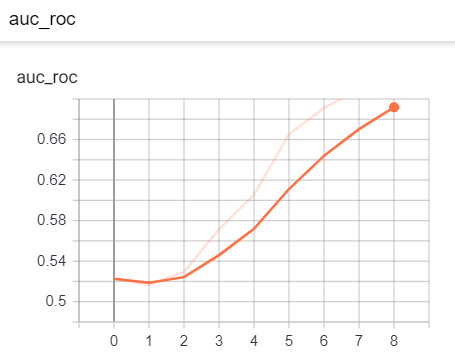

In [1]:
from IPython.display import Image
Image(filename="model_1_train_auc.png")

**MODEL 1 Train Loss vs Epoch Plot**

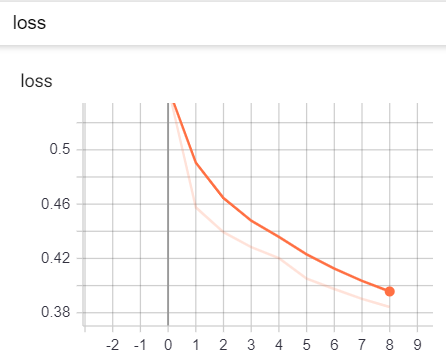

In [2]:
Image(filename="model_1_train_loss.png")

**MODEL 1 Validation AUC vs Epoch Plot**

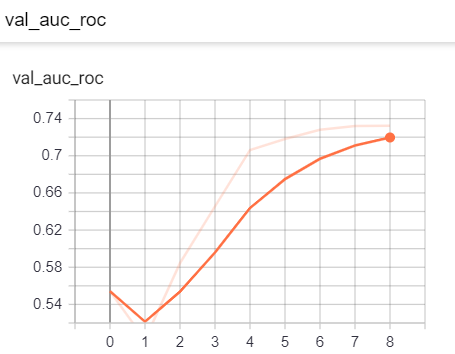

In [3]:
Image(filename="model_1_val_auc.png")

**MODEL 1 Validation Loss vs Epoch Plot**

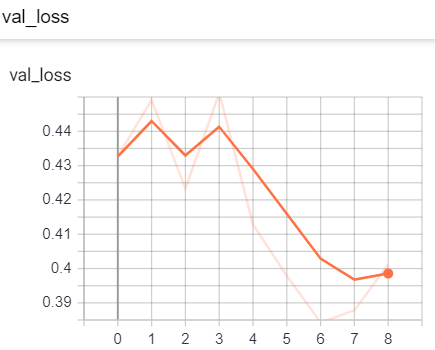

In [4]:
Image(filename="model_1_val_loss.png")

In [0]:
score_1 = model_final_1.evaluate({'input_1_1': X_test_essay_padded, 'input_1_2': x_test_school_state,'input_1_3': x_test_project_grade_category,'input_1_4': x_test_clean_categories,'input_1_5': x_test_clean_subcategories,'input_1_6': x_test_teacher_prefix,'input_1_7': x_test_rem_input_1}, {'model_output_final_1': Y_test_cat}, batch_size=132, verbose=0) 

In [0]:
print('Test Loss:', score_1[0]) 
print('Test AUC:', score_1[1])

Test Loss: 0.3976265807702937
Test AUC: 0.7378463465207813


**Conclusion**

1. Model 1 Trained on train data has AUC of 0.723 with loss 0.384 and the loss on CV data is 0.401 with AUC of 0.732
2. Model 1 AUC on Test data is 0.737 with a loss of 0.397

## Model 2

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_1 = TfidfVectorizer()
vectorizer_1.fit(X_train['preprocessed_essay'].values)
X_train_essay_tfidf=vectorizer_1.transform(X_train['preprocessed_essay'].values)
idf_val=vectorizer_1.idf_
feature_names=vectorizer_1.get_feature_names()

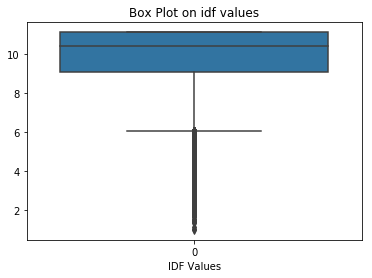

In [0]:
sns.boxplot(data=idf_val)
plt.title('Box Plot on idf values')
plt.xlabel('IDF Values')
plt.show()

So from the above  box  plot values between 6 and 12 are in IQR range and we can consider the values between 3.5 to 11.5 to have better performance for LSTM

In [0]:
idf_val_list=list(idf_val)

In [0]:
# https://stackoverflow.com/questions/209840/convert-two-lists-into-a-dictionary

word_idf_dict = dict(zip(feature_names, idf_val_list))

In [0]:
useful_words=[]
for word in word_idf_dict.keys():
    if word_idf_dict[word]>=3.5 and word_idf_dict[word]<=11.5:
        useful_words.append(word)

In [0]:
# https://stackoverflow.com/questions/3869487/how-do-i-create-a-dictionary-with-keys-from-a-list-and-values-defaulting-to-say

# Storing the Useful words in a dictionary for a fast lookup

useful_dict=dict((el,1) for el in useful_words)

In [0]:
# https://gist.github.com/sebleier/554280
# Built the loop for removing words except the useful words based on Stop words example
train_useful_essay=[]
cv_useful_essay=[]
test_useful_essay=[]

for sentance in tqdm(X_train['preprocessed_essay'].values):
    sentance = ' '.join(e for e in sentance.lower().split() if useful_dict.get(e)==1)
    train_useful_essay.append(sentance.lower().strip())

for sentance in tqdm(X_cv['preprocessed_essay'].values):
    sentance = ' '.join(e for e in sentance.lower().split() if useful_dict.get(e)==1)
    cv_useful_essay.append(sentance.lower().strip())

for sentance in tqdm(X_test['preprocessed_essay'].values):
    sentance = ' '.join(e for e in sentance.lower().split() if useful_dict.get(e)==1)
    test_useful_essay.append(sentance.lower().strip())


100%|██████████| 36052/36052 [00:02<00:00, 16946.86it/s]


In [0]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
# https://stackoverflow.com/questions/51956000/what-does-keras-tokenizer-method-exactly-do

from keras.preprocessing.text import Tokenizer
t = Tokenizer()
t.fit_on_texts(train_useful_essay)
vocab_size = len(t.word_index) + 1
train_encoded_essay_2 = t.texts_to_sequences(train_useful_essay)

In [0]:
# Preparing cv and test essay encodings
cv_encoded_essay_2 = t.texts_to_sequences(cv_useful_essay)
test_encoded_essay_2 = t.texts_to_sequences(test_useful_essay)

In [0]:
# Counting the number of words in Essay Train Data

essay_len_2=[]
for sent in train_useful_essay:
    temp_2=sent.split()
    essay_len_2.append(len(temp_2))
    sent=' '.join(temp_2)

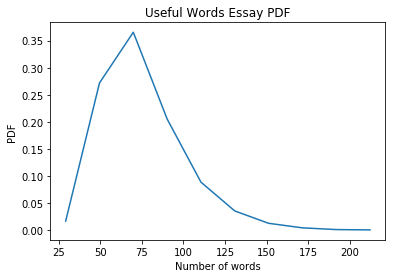

In [0]:
# Plotting PDF of Number of words in Essay

count_essay_words_2=np.array(essay_len_2)
counts_2, bin_edges_2 = np.histogram(count_essay_words_2, bins=10, 
                                 density = True)
pdf_2 = counts_2/(sum(counts_2))


plt.plot(bin_edges_2[1:],pdf_2)
plt.xlabel('Number of words')
plt.ylabel('PDF')
plt.title('Useful Words Essay PDF')
plt.show()

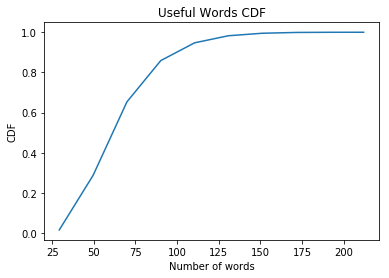

In [0]:
# Plotting CDF for Number of words in Essay

cdf_2 = np.cumsum(pdf_2)

plt.plot(bin_edges_2[1:], cdf_2)
plt.xlabel('Number of words')
plt.ylabel('CDF')
plt.title('Useful Words CDF')
plt.show()

From the CDF plot it can be observed that almost more than 95% of the essay with useful words contain 175 words or less. So we can take max_essay_length=175 for this scenario

In [0]:
max_essay_length = 175
X_train_essay_padded_2 = sequence.pad_sequences(train_encoded_essay_2, maxlen=max_essay_length)
X_test_essay_padded_2 = sequence.pad_sequences(test_encoded_essay_2, maxlen=max_essay_length)
X_cv_essay_padded_2 = sequence.pad_sequences(cv_encoded_essay_2, maxlen=max_essay_length)

In [0]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
downloaded = drive.CreateFile({'id':link_id3}) 
downloaded.GetContentFile('glove_vectors')
with open('glove_vectors', 'rb') as f:
    glove_model = pickle.load(f)
    glove_words =  set(glove_model.keys())

In [0]:
# https://machinelearningmastery.com/use-word-embedding-layers-deep-learning-keras/
embedding_matrix = np.zeros((vocab_size, 300))
for word, i in t.word_index.items():
    embedding_vector = glove_model.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector    

In [0]:
# Refered from LSTM Course code
# https://keras.io/getting-started/functional-api-guide/

embedding_vecor_length = 300
input_2_1=Input(shape=(175,), dtype='int32', name='input_2_1')
model_2_1=Embedding(vocab_size, embedding_vecor_length,weights=[embedding_matrix], input_length=max_essay_length,trainable=False)(input_2_1)
model_2_1=LSTM(45,return_sequences=True)(model_2_1)
model_2_1=Flatten()(model_2_1)
model_2_1=Dropout(0.2)(model_2_1)

In [0]:

input_2_2=Input(shape=(1,), dtype='int32', name='input_2_2')
model_2_2= Embedding(vocab_2 ,embedding_size_2, input_length = 1 )(input_2_2)
model_2_2=Flatten()(model_2_2)
model_2_2=Dropout(0.25)(model_2_2)

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

input_2_3=Input(shape=(1,), dtype='int32', name='input_2_3')
model_2_3= Embedding(vocab_3 ,embedding_size_3, input_length = 1 )(input_2_3)
model_2_3=Flatten()(model_2_3)
model_2_3=Dropout(0.2)(model_2_3)

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

input_2_4=Input(shape=(1,), dtype='int32', name='input_2_4')
model_2_4= Embedding(vocab_4 ,embedding_size_4, input_length = 1 )(input_2_4)
model_2_4=Flatten()(model_2_4)
model_2_4=Dropout(0.2)(model_2_4)

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

input_2_5=Input(shape=(1,), dtype='int32', name='input_2_5')
model_2_5= Embedding(vocab_5 ,embedding_size_5, input_length = 1 )(input_2_5)
model_2_5=Flatten()(model_2_5)
model_2_5=Dropout(0.25)(model_2_5)

In [0]:
# https://medium.com/@satnalikamayank12/on-learning-embeddings-for-categorical-data-using-keras-165ff2773fc9

input_2_6=Input(shape=(1,), dtype='int32', name='input_2_6')
model_2_6= Embedding(vocab_6 ,embedding_size_6, input_length = 1 )(input_2_6)
model_2_6=Flatten()(model_2_6)
model_2_6=Dropout(0.2)(model_2_6)

In [0]:
input_2_7=Input(shape=(input_dim_1,), dtype='float32', name='input_2_7')
model_2_7=Dense(128, activation='relu', input_shape=(input_dim_1,), kernel_initializer='he_normal')(input_2_7)
model_2_7=Dropout(0.3)(model_2_7)

In [0]:
# https://keras.io/getting-started/functional-api-guide/

model_2 = concatenate([model_2_1, model_2_2,model_2_3,model_2_4,model_2_5,model_2_6,model_2_7])

In [0]:
model_2 = Dense(16, activation='relu',kernel_initializer='he_normal')(model_2)
model_2=BatchNormalization()(model_2)
model_2=Dropout(0.55)(model_2)
model_2 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_2)
model_2=BatchNormalization()(model_2)
model_2=Dropout(0.75)(model_2)
model_2 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_2)
model_output_final_2=Dense(output_dim, activation='softmax',name='model_output_final_2')(model_2)

W0729 14:28:11.636883 140506092902272 nn_ops.py:4224] Large dropout rate: 0.55 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.
W0729 14:28:11.755286 140506092902272 nn_ops.py:4224] Large dropout rate: 0.75 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.


In [0]:
model_final_2 = Model(inputs=[input_2_1,input_2_2,input_2_3,input_2_4,input_2_5,input_2_6,input_2_7], outputs=[model_output_final_2])

In [0]:
model_final_2.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2_1 (InputLayer)          (None, 175)          0                                            
__________________________________________________________________________________________________
embedding_13 (Embedding)        (None, 175, 300)     12246000    input_2_1[0][0]                  
__________________________________________________________________________________________________
input_2_2 (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
input_2_3 (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
input_2_4 

In [0]:
model_final_2.compile(loss="categorical_crossentropy", optimizer='adam',metrics=[auc_roc])

In [0]:


training_history_2=model_final_2.fit({'input_2_1': X_train_essay_padded_2, 'input_2_2': x_train_school_state,'input_2_3': x_train_project_grade_category,'input_2_4': x_train_clean_categories,'input_2_5': x_train_clean_subcategories,'input_2_6': x_train_teacher_prefix,'input_2_7': x_train_rem_input_1},
          {'model_output_final_2': Y_train_cat},
          epochs=9, batch_size=132,verbose=1, validation_data=({'input_2_1': X_cv_essay_padded_2, 'input_2_2': x_cv_school_state,'input_2_3': x_cv_project_grade_category,'input_2_4': x_cv_clean_categories,'input_2_5': x_cv_clean_subcategories,'input_2_6': x_cv_teacher_prefix,'input_2_7': x_cv_rem_input_1}, {'model_output_final_2': Y_cv_cat}),callbacks=[tensorboard_callback])

Train on 49041 samples, validate on 24155 samples
Epoch 1/9
49041/49041 [==============================] - 166s 3ms/step - loss: 0.5494 - auc_roc: 0.5198 - val_loss: 0.4405 - val_auc_roc: 0.5430
Epoch 2/9
49041/49041 [==============================] - 163s 3ms/step - loss: 0.4579 - auc_roc: 0.5274 - val_loss: 0.4308 - val_auc_roc: 0.6147
Epoch 3/9
49041/49041 [==============================] - 165s 3ms/step - loss: 0.4353 - auc_roc: 0.5745 - val_loss: 0.4143 - val_auc_roc: 0.6688
Epoch 4/9
49041/49041 [==============================] - 164s 3ms/step - loss: 0.4251 - auc_roc: 0.6123 - val_loss: 0.4086 - val_auc_roc: 0.6826
Epoch 5/9
49041/49041 [==============================] - 165s 3ms/step - loss: 0.4137 - auc_roc: 0.6400 - val_loss: 0.4027 - val_auc_roc: 0.6898
Epoch 6/9
49041/49041 [==============================] - 166s 3ms/step - loss: 0.4094 - auc_roc: 0.6558 - val_loss: 0.4112 - val_auc_roc: 0.6985
Epoch 7/9
49041/49041 [==============================] - 165s 3ms/step - loss: 0

**MODEL 2 Train AUC vs Epoch Plot**

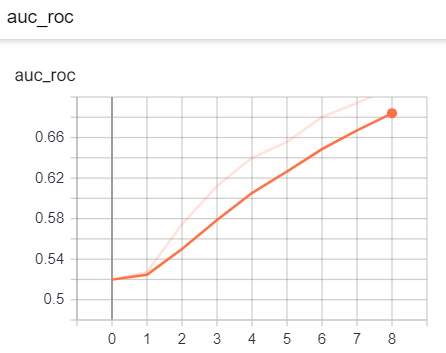

In [5]:
Image(filename="model_2_train_auc.png")

**MODEL 2 Train Loss vs Epoch Plot**

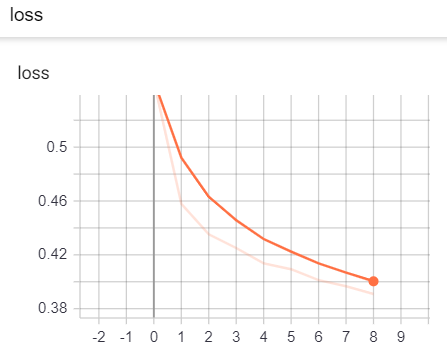

In [6]:
Image(filename="model_2_train_loss.png")

**MODEL 2 Validation AUC vs Epoch Plot**

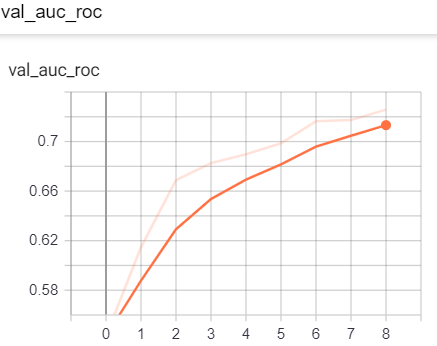

In [7]:
Image(filename="model_2_val_auc.png")

**MODEL 2 Validation Loss vs Epoch Plot**

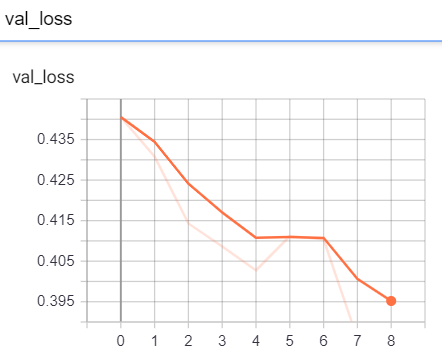

In [8]:
Image(filename="model_2_val_loss.png")

In [0]:
score_2 = model_final_2.evaluate({'input_2_1': X_test_essay_padded_2, 'input_2_2': x_test_school_state,'input_2_3': x_test_project_grade_category,'input_2_4': x_test_clean_categories,'input_2_5': x_test_clean_subcategories,'input_2_6': x_test_teacher_prefix,'input_2_7': x_test_rem_input_1}, {'model_output_final_2': Y_test_cat}, batch_size=132, verbose=0) 

In [0]:
print('Test Loss:', score_2[0]) 
print('Test AUC:', score_2[1])

Test Loss: 0.386194732257162
Test AUC: 0.7256248182142416


**Conclusion**

1. Model 2 trained on Train Data has AUC 0.723 with loss 0.384 and on Validation Data with loss 0.401 and AUC 0.732
2. Model 2 on Test data has AUC 0.725 with loss 0.386

## Model 3

**Preparing One Hot Encoding of Remaining Features**

In [42]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(vocabulary=list(sorted_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_categories'].values)

X_train_categories_one_hot = vectorizer.transform(X_train['clean_categories'].values)
X_cv_categories_one_hot = vectorizer.transform(X_cv['clean_categories'].values)
X_test_categories_one_hot = vectorizer.transform(X_test['clean_categories'].values)

print("After vectorizations")
print(X_train_categories_one_hot.shape)
print(X_cv_categories_one_hot.shape)
print(X_test_categories_one_hot.shape)
print(vectorizer.get_feature_names())

After vectorizations
(49041, 9)
(24155, 9)
(36052, 9)
['Warmth', 'Care_Hunger', 'History_Civics', 'Music_Arts', 'AppliedLearning', 'SpecialNeeds', 'Health_Sports', 'Math_Science', 'Literacy_Language']


In [43]:
vectorizer = CountVectorizer(vocabulary=list(sorted_sub_cat_dict.keys()), lowercase=False, binary=True)
vectorizer.fit(X_train['clean_subcategories'].values)

X_train_sub_categories_one_hot = vectorizer.transform(X_train['clean_subcategories'].values)
X_cv_sub_categories_one_hot = vectorizer.transform(X_cv['clean_subcategories'].values)
X_test_sub_categories_one_hot = vectorizer.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_sub_categories_one_hot.shape)
print(X_cv_sub_categories_one_hot.shape)
print(X_test_sub_categories_one_hot.shape)
print(vectorizer.get_feature_names())

After vectorizations
(49041, 30)
(24155, 30)
(36052, 30)
['Economics', 'CommunityService', 'FinancialLiteracy', 'ParentInvolvement', 'Extracurricular', 'Civics_Government', 'ForeignLanguages', 'NutritionEducation', 'Warmth', 'Care_Hunger', 'SocialSciences', 'PerformingArts', 'CharacterEducation', 'TeamSports', 'Other', 'College_CareerPrep', 'Music', 'History_Geography', 'Health_LifeScience', 'EarlyDevelopment', 'ESL', 'Gym_Fitness', 'EnvironmentalScience', 'VisualArts', 'Health_Wellness', 'AppliedSciences', 'SpecialNeeds', 'Literature_Writing', 'Mathematics', 'Literacy']


In [44]:
vectorizer = CountVectorizer(lowercase=False, binary=True)
vectorizer.fit(X_train['school_state'].values)

X_train_school_state_one_hot = vectorizer.transform(X_train['school_state'].values)
X_cv_school_state_one_hot = vectorizer.transform(X_cv['school_state'].values)
X_test_school_state_one_hot = vectorizer.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_school_state_one_hot.shape)
print(X_cv_school_state_one_hot.shape)
print(X_test_school_state_one_hot.shape)
print(vectorizer.get_feature_names())

After vectorizations
(49041, 51)
(24155, 51)
(36052, 51)
['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY']


In [45]:
vectorizer = CountVectorizer(lowercase=False, binary=True)
vectorizer.fit(X_train['teacher_prefix'].values)

X_train_teacher_prefix_one_hot = vectorizer.transform(X_train['teacher_prefix'].values)
X_cv_teacher_prefix_one_hot = vectorizer.transform(X_cv['teacher_prefix'].values)
X_test_teacher_prefix_one_hot = vectorizer.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_prefix_one_hot.shape)
print(X_cv_teacher_prefix_one_hot.shape)
print(X_test_teacher_prefix_one_hot.shape)
print(vectorizer.get_feature_names())

After vectorizations
(49041, 6)
(24155, 6)
(36052, 6)
['Dr', 'Mr', 'Mrs', 'Ms', 'Nan', 'Teacher']


In [46]:
grade_categories=['Grades PreK-2','Grades 3-5','Grades 6-8','Grades 9-12']
vectorizer = CountVectorizer(vocabulary=grade_categories,lowercase=False, binary=True)
vectorizer.fit(X_train['project_grade_category'].values)

X_train_grade_category_one_hot = vectorizer.transform(X_train['project_grade_category'].values)
X_cv_grade_category_one_hot = vectorizer.transform(X_cv['project_grade_category'].values)
X_test_grade_category_one_hot = vectorizer.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_category_one_hot.shape)
print(X_cv_grade_category_one_hot.shape)
print(X_test_grade_category_one_hot.shape)
print(vectorizer.get_feature_names())

After vectorizations
(49041, 4)
(24155, 4)
(36052, 4)
['Grades PreK-2', 'Grades 3-5', 'Grades 6-8', 'Grades 9-12']


In [0]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
x_train_rem_input_3=hstack((X_train_price_norm,X_train_quantity_norm,X_train_prev_posted_projects_norm,x_train_resource_summary_contains_digits,X_train_categories_one_hot, X_train_sub_categories_one_hot, X_train_school_state_one_hot, X_train_teacher_prefix_one_hot, X_train_grade_category_one_hot)).tocsr()
x_cv_rem_input_3=hstack((X_cv_price_norm,X_cv_quantity_norm,X_cv_prev_posted_projects_norm,x_cv_resource_summary_contains_digits,X_cv_categories_one_hot, X_cv_sub_categories_one_hot, X_cv_school_state_one_hot, X_cv_teacher_prefix_one_hot, X_cv_grade_category_one_hot)).tocsr()
x_test_rem_input_3=hstack((X_test_price_norm,X_test_quantity_norm,X_test_prev_posted_projects_norm,x_test_resource_summary_contains_digits,X_test_categories_one_hot, X_test_sub_categories_one_hot, X_test_school_state_one_hot, X_test_teacher_prefix_one_hot, X_test_grade_category_one_hot)).tocsr()


In [0]:
# Converting remaining input into a form for training

x_train_rem_input_3=x_train_rem_input_3.toarray()
x_cv_rem_input_3=x_cv_rem_input_3.toarray()
x_test_rem_input_3=x_test_rem_input_3.toarray()

**Creating the Model**

In [0]:
# Refered from LSTM Course code
# https://keras.io/getting-started/functional-api-guide/
max_essay_length=275
embedding_vecor_length = 300
input_3_1=Input(shape=(275,), dtype='int32', name='input_3_1')
model_3_1=Embedding(vocab_size, embedding_vecor_length,weights=[embedding_matrix], input_length=max_essay_length,trainable=False)(input_3_1)
model_3_1=LSTM(50,return_sequences=True)(model_3_1)
model_3_1=Flatten()(model_3_1)
model_3_1=Dropout(0.15)(model_3_1)

In [0]:
input_dim_shape_3=x_train_rem_input_3.shape[1]

In [0]:
# Refered from Keras_Mnist Code from Course

if K.image_data_format() == 'channels_first':
    x_train_rem_input_3 = x_train_rem_input_3.reshape(x_train_rem_input_3.shape[0], 1, input_dim_shape_3)
    x_cv_rem_input_3= x_cv_rem_input_3.reshape(x_cv_rem_input_3.shape[0], 1, input_dim_shape_3)
    x_test_rem_input_3 = x_test_rem_input_3.reshape(x_test_rem_input_3.shape[0], 1,input_dim_shape_3)
    input_shape_final_3 = (1, input_dim_shape_3)
else:
    x_train_rem_input_3 = x_train_rem_input_3.reshape(x_train_rem_input_3.shape[0], input_dim_shape_3,1)
    x_cv_rem_input_3= x_cv_rem_input_3.reshape(x_cv_rem_input_3.shape[0], input_dim_shape_3,1)
    x_test_rem_input_3 = x_test_rem_input_3.reshape(x_test_rem_input_3.shape[0],input_dim_shape_3,1)
    input_shape_final_3 = (input_dim_shape_3, 1)

In [0]:
from keras.layers import Conv1D
input_3_2=Input(shape=input_shape_final_3 , dtype='float32', name='input_3_2')
model_3_2=Conv1D(16, kernel_size=3,input_shape=input_shape_final_3)(input_3_2)
model_3_2=Conv1D(32, kernel_size=5,strides=1, padding='same', activation='relu',kernel_initializer='he_normal')(model_3_2)
model_3_2=Flatten()(model_3_2)
model_3_2=Dropout(0.15)(model_3_2)

In [0]:
# https://keras.io/getting-started/functional-api-guide/

model_3 = concatenate([model_3_1, model_3_2])

In [77]:
model_3 = Dense(16, activation='relu',kernel_initializer='he_normal')(model_3)
model_3=BatchNormalization()(model_3)
model_3=Dropout(0.55)(model_3)
model_3 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_3)
model_3=BatchNormalization()(model_3)
model_3=Dropout(0.75)(model_3)
model_3 = Dense(32, activation='relu',kernel_initializer='he_normal')(model_3)
model_output_final_3=Dense(output_dim, activation='softmax',name='model_output_final_3')(model_3)


W0731 13:48:09.338061 140409604233088 nn_ops.py:4224] Large dropout rate: 0.55 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.
W0731 13:48:09.456568 140409604233088 nn_ops.py:4224] Large dropout rate: 0.75 (>0.5). In TensorFlow 2.x, dropout() uses dropout rate instead of keep_prob. Please ensure that this is intended.


In [0]:
model_final_3 = Model(inputs=[input_3_1,input_3_2], outputs=[model_output_final_3])

In [79]:
model_final_3.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3_1 (InputLayer)          (None, 275)          0                                            
__________________________________________________________________________________________________
input_3_2 (InputLayer)          (None, 104, 1)       0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 275, 300)     12339300    input_3_1[0][0]                  
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 102, 16)      64          input_3_2[0][0]                  
__________________________________________________________________________________________________
lstm_2 (LS

In [0]:
model_final_3.compile(loss="categorical_crossentropy", optimizer='adam' ,metrics=[auc_roc])

In [84]:

training_history_3=model_final_3.fit({'input_3_1': X_train_essay_padded, 'input_3_2': x_train_rem_input_3},
          {'model_output_final_3': Y_train_cat},
          epochs=8, batch_size=132,verbose=1, validation_data=({'input_3_1': X_cv_essay_padded, 'input_3_2': x_cv_rem_input_3}, {'model_output_final_3': Y_cv_cat}),callbacks=[tensorboard_callback])

Train on 49041 samples, validate on 24155 samples
Epoch 1/8
49041/49041 [==============================] - 290s 6ms/step - loss: 0.4908 - auc_roc: 0.5104 - val_loss: 0.4442 - val_auc_roc: 0.5213
Epoch 2/8
49041/49041 [==============================] - 292s 6ms/step - loss: 0.4500 - auc_roc: 0.5175 - val_loss: 0.4345 - val_auc_roc: 0.5442
Epoch 3/8
49041/49041 [==============================] - 291s 6ms/step - loss: 0.4392 - auc_roc: 0.5221 - val_loss: 0.4394 - val_auc_roc: 0.5674
Epoch 4/8
49041/49041 [==============================] - 291s 6ms/step - loss: 0.4294 - auc_roc: 0.5512 - val_loss: 0.4185 - val_auc_roc: 0.6477
Epoch 5/8
49041/49041 [==============================] - 290s 6ms/step - loss: 0.4269 - auc_roc: 0.5564 - val_loss: 0.4320 - val_auc_roc: 0.6656
Epoch 6/8
49041/49041 [==============================] - 290s 6ms/step - loss: 0.4081 - auc_roc: 0.6502 - val_loss: 0.3817 - val_auc_roc: 0.7257
Epoch 7/8
49041/49041 [==============================] - 291s 6ms/step - loss: 0

**MODEL 3 Train AUC vs Epoch Plot**

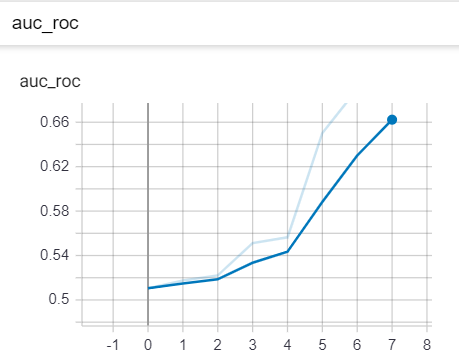

In [9]:
Image(filename="model_3_train_auc.png")

**MODEL 3 Train Loss vs Epoch Plot**

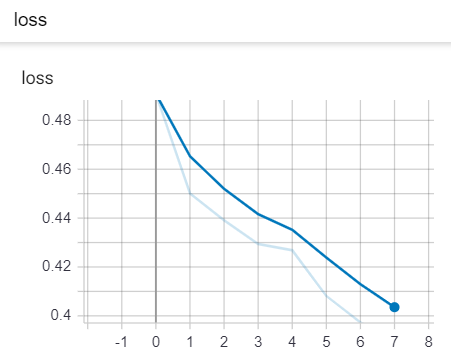

In [11]:
Image(filename="model_3_train_loss.png")

**MODEL 3 Validation AUC vs Epoch Plot**

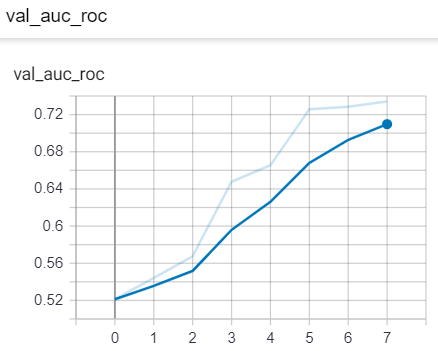

In [12]:
Image(filename="model_3_val_auc.png")

**MODEL 3 Validation Loss vs Epoch Plot**

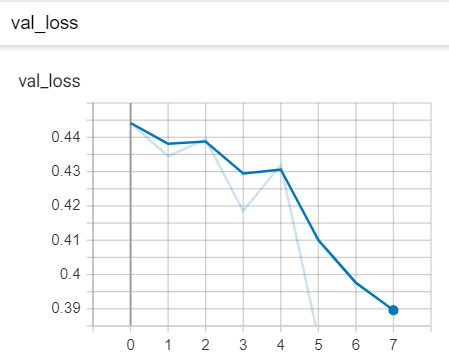

In [13]:
Image(filename="model_3_val_loss.png")

In [0]:
score_3 = model_final_3.evaluate({'input_3_1': X_test_essay_padded, 'input_3_2': x_test_rem_input_3}, {'model_output_final_3': Y_test_cat}, batch_size=132, verbose=0) 

In [86]:
print('Test Loss:', score_3[0]) 
print('Test AUC:', score_3[1])

Test Loss: 0.3765889739211201
Test AUC: 0.7386617015906719


**Conclusion**

1. Model 3 trained on Train data has AUC 0.709 with a loss 0.389 and on Validation Data with loss 0.378 and AUC 0.734
2. Model 3 on Test data has AUC 0.738 with a loss 0.376

### Summary

In [14]:
# http://zetcode.com/python/prettytable/
from prettytable import PrettyTable
    
pt = PrettyTable()

pt.field_names = ["MODEL", "Train Loss", "Train AUC", "Validation Loss", "Validation AUC", "Test Loss", "Test AUC"]
pt.add_row(["MODEL 1", 0.384, 0.723, 0.401, 0.732, 0.397, 0.737])
pt.add_row(["MODEL 2", 0.390, 0.708, 0.397, 0.725, 0.386, 0.725])
pt.add_row(["MODEL 3", 0.389, 0.709, 0.378, 0.734, 0.376, 0.738])
print(pt)

+---------+------------+-----------+-----------------+----------------+-----------+----------+
|  MODEL  | Train Loss | Train AUC | Validation Loss | Validation AUC | Test Loss | Test AUC |
+---------+------------+-----------+-----------------+----------------+-----------+----------+
| MODEL 1 |   0.384    |   0.723   |      0.401      |     0.732      |   0.397   |  0.737   |
| MODEL 2 |    0.39    |   0.708   |      0.397      |     0.725      |   0.386   |  0.725   |
| MODEL 3 |   0.389    |   0.709   |      0.378      |     0.734      |   0.376   |  0.738   |
+---------+------------+-----------+-----------------+----------------+-----------+----------+
